In [60]:
import numpy as np
import pandas as pd
import seaborn as sbn
import os
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
from sklearn.model_selection import train_test_split
import keras
from random import randint

In [2]:
import io
import requests
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)

Mounted at /content/gdrive


In [3]:
DIR = "/content//gdrive/MyDrive/road"


In [4]:
# meta/images paths
meta_file= os.path.join(DIR, 'metadata.csv')
IMAGE_PATH = os.path.join(DIR, 'Images')

In [5]:
# load meta
df = pd.read_csv(meta_file)

# adding new column = filepath (complete image path)
df['filepath'] = df['filename'].map(lambda x:  os.path.join(IMAGE_PATH,x))

# mapping dictionary
labelmap = {}
for l in df.label.unique().tolist():
    if l == 1:
        labelmap[l] = 'dirty'
    else:
        labelmap[l] = 'clean'

# seperate list of image that are labelled = dirty
df_dirty = df[df['label'] == 1]
df_dirty.reset_index(drop=True, inplace=True)

print(f"Found {df.groupby('label').count()['filename'][1]} images that are labelled = dirty")
print(f"Found {df.groupby('label').count()['filename'][0]} that are labelled = clean")

Found 124 images that are labelled = dirty
Found 113 that are labelled = clean


In [7]:
df.head(10)

,filename,label,filepath
0,dirty_2.jpg,1,/content//gdrive/MyDrive/road/Images/dirty_2.jpg
1,clean_36.jpg,0,/content//gdrive/MyDrive/road/Images/clean_36.jpg
2,clean_31.jpg,0,/content//gdrive/MyDrive/road/Images/clean_31.jpg
3,dirty_69.jpg,1,/content//gdrive/MyDrive/road/Images/dirty_69.jpg
4,clean_113.jpg,0,/content//gdrive/MyDrive/road/Images/clean_113...
5,clean_102.jpg,0,/content//gdrive/MyDrive/road/Images/clean_102...
6,clean_43.jpg,0,/content//gdrive/MyDrive/road/Images/clean_43.jpg
7,dirty_27.jpg,1,/content//gdrive/MyDrive/road/Images/dirty_27.jpg
8,dirty_53.jpg,1,/content//gdrive/MyDrive/road/Images/dirty_53.jpg
9,clean_55.jpg,0,/content//gdrive/MyDrive/road/Images/clean_55.jpg


<Axes: xlabel='label', ylabel='count'>

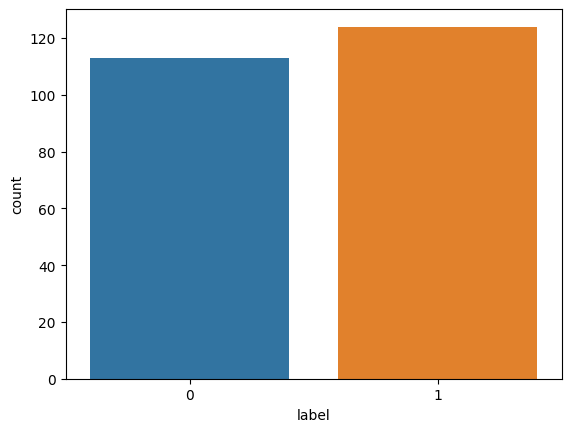

In [8]:
sbn.countplot(x = 'label', data = df)

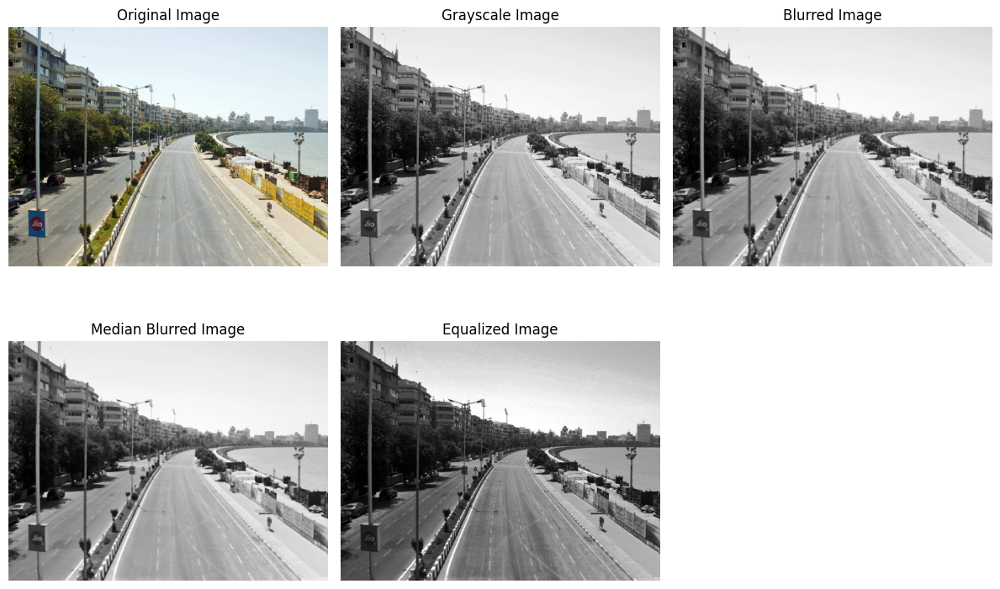

In [157]:
# Read the image
image = cv2.imread('/content/gdrive/MyDrive/road/Images/clean_1.jpg')

# Convert to grayscale
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Apply Gaussian blur to remove noise
blurred_image = cv2.GaussianBlur(gray_image, (5, 5), 0)

# Apply Median blur to remove salt-and-pepper noise
median_blurred_image = cv2.medianBlur(gray_image, 5)

# Perform histogram equalization to correct for uneven illumination
equalized_image = cv2.equalizeHist(gray_image)

# Display the images using matplotlib.pyplot.imshow
plt.figure(figsize=(12, 8))

plt.subplot(231)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(232)
plt.imshow(gray_image, cmap='gray')
plt.title('Grayscale Image')
plt.axis('off')

plt.subplot(233)
plt.imshow(blurred_image, cmap='gray')
plt.title('Blurred Image')
plt.axis('off')

plt.subplot(234)
plt.imshow(median_blurred_image, cmap='gray')
plt.title('Median Blurred Image')
plt.axis('off')

plt.subplot(235)
plt.imshow(equalized_image, cmap='gray')
plt.title('Equalized Image')
plt.axis('off')

plt.tight_layout()
plt.show()


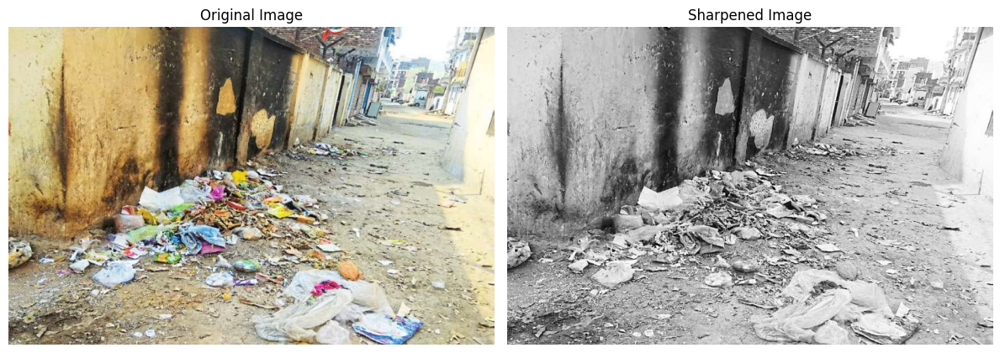

In [158]:
# Read the image
image = cv2.imread('/content/gdrive/MyDrive/road/Images/dirty_114.jpg')

# Convert to grayscale
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Apply Gaussian blur to the grayscale image
blurred_image = cv2.GaussianBlur(gray_image, (5, 5), 0)

# Perform unsharp masking for sharpening
unsharp_image = cv2.addWeighted(gray_image, 1.5, blurred_image, -0.5, 0)

# Display the images using matplotlib.pyplot.imshow
plt.figure(figsize=(12, 6))

plt.subplot(121)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(122)
plt.imshow(unsharp_image, cmap='gray')
plt.title('Sharpened Image')
plt.axis('off')

plt.tight_layout()
plt.show()

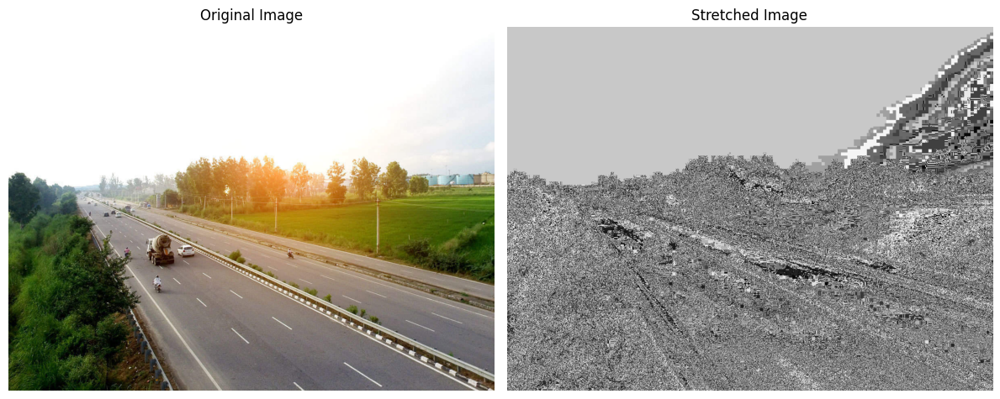

In [159]:
# Read the image
image = cv2.imread('/content/gdrive/MyDrive/road/Images/clean_104.jpg')

# Convert to grayscale
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Calculate the histogram of the grayscale image
hist, bins = np.histogram(gray_image.flatten(), 256, [0, 256])

# Calculate the cumulative distribution function (CDF) of the histogram
cdf = hist.cumsum()
cdf_normalized = cdf * hist.max() / cdf.max()

# Perform histogram stretching
stretched_image = np.interp(gray_image.flatten(), bins[:-1], cdf_normalized).reshape(gray_image.shape).astype(np.uint8)

# Display the images using matplotlib.pyplot.imshow
plt.figure(figsize=(12, 6))

plt.subplot(121)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(122)
plt.imshow(stretched_image, cmap='gray')
plt.title('Stretched Image')
plt.axis('off')

plt.tight_layout()
plt.show()


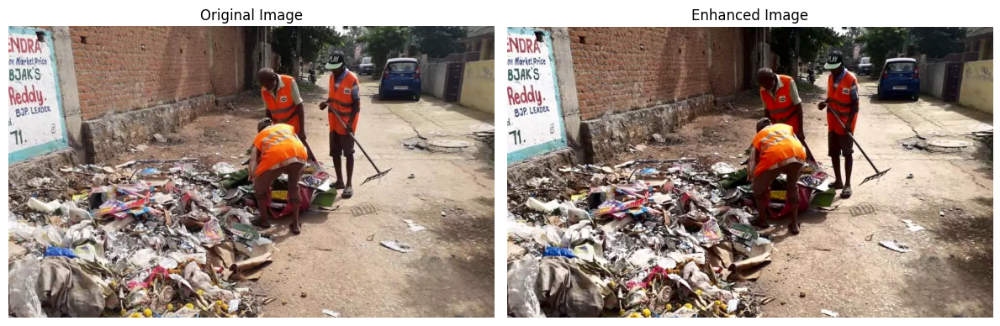

In [160]:
# Read the image
image = cv2.imread('/content/gdrive/MyDrive/road/Images/dirty_25.jpg')

# Convert the image to Lab color space
lab_image = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)

# Split the Lab image into L, a, and b channels
l_channel, a_channel, b_channel = cv2.split(lab_image)

# Apply histogram equalization to the L channel
equalized_l_channel = cv2.equalizeHist(l_channel)

# Merge the equalized L channel with the original a and b channels
enhanced_lab_image = cv2.merge((equalized_l_channel, a_channel, b_channel))

# Convert the enhanced Lab image back to BGR color space
enhanced_image = cv2.cvtColor(enhanced_lab_image, cv2.COLOR_LAB2BGR)

# Display the images using matplotlib.pyplot.imshow
plt.figure(figsize=(12, 6))

plt.subplot(121)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(122)
plt.imshow(cv2.cvtColor(enhanced_image, cv2.COLOR_BGR2RGB))
plt.title('Enhanced Image')
plt.axis('off')

plt.tight_layout()
plt.show()


In [164]:
!pip install imagehash


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 18.1 MB/s eta 0:00:00


In [165]:
from PIL import Image
import imagehash
import os

# Define your dataset directory
dataset_dir = '/content/gdrive/MyDrive/road/Images'

# Initialize a dictionary to store image hashes
image_hashes = {}

# Iterate over all image files in the dataset directory
for filename in os.listdir(dataset_dir):
    if filename.endswith('.jpg') or filename.endswith('.png'):
        # Load the image
        image_path = os.path.join(dataset_dir, filename)
        image = Image.open(image_path)

        # Compute the image hash
        image_hash = imagehash.average_hash(image)

        # Check if the hash already exists in the dictionary
        if image_hash in image_hashes:
            # Duplicate image found
            print(f"Duplicate image: {image_path} is similar to {image_hashes[image_hash]}")
        else:
            # Add the hash to the dictionary
            image_hashes[image_hash] = image_path


Duplicate image: /content/gdrive/MyDrive/road/Images/clean_100.jpg is similar to /content/gdrive/MyDrive/road/Images/clean_20.jpg
Duplicate image: /content/gdrive/MyDrive/road/Images/dirty_54.jpg is similar to /content/gdrive/MyDrive/road/Images/dirty_32.jpg
Duplicate image: /content/gdrive/MyDrive/road/Images/dirty_117.jpg is similar to /content/gdrive/MyDrive/road/Images/dirty_38.jpg
Duplicate image: /content/gdrive/MyDrive/road/Images/dirty_20.jpg is similar to /content/gdrive/MyDrive/road/Images/dirty_119.jpg
Duplicate image: /content/gdrive/MyDrive/road/Images/dirty_14.jpg is similar to /content/gdrive/MyDrive/road/Images/dirty_16.jpg
Duplicate image: /content/gdrive/MyDrive/road/Images/dirty_115.jpg is similar to /content/gdrive/MyDrive/road/Images/dirty_118.jpg
Duplicate image: /content/gdrive/MyDrive/road/Images/dirty_110.jpg is similar to /content/gdrive/MyDrive/road/Images/dirty_38.jpg
Duplicate image: /content/gdrive/MyDrive/road/Images/dirty_108.jpg is similar to /content/g

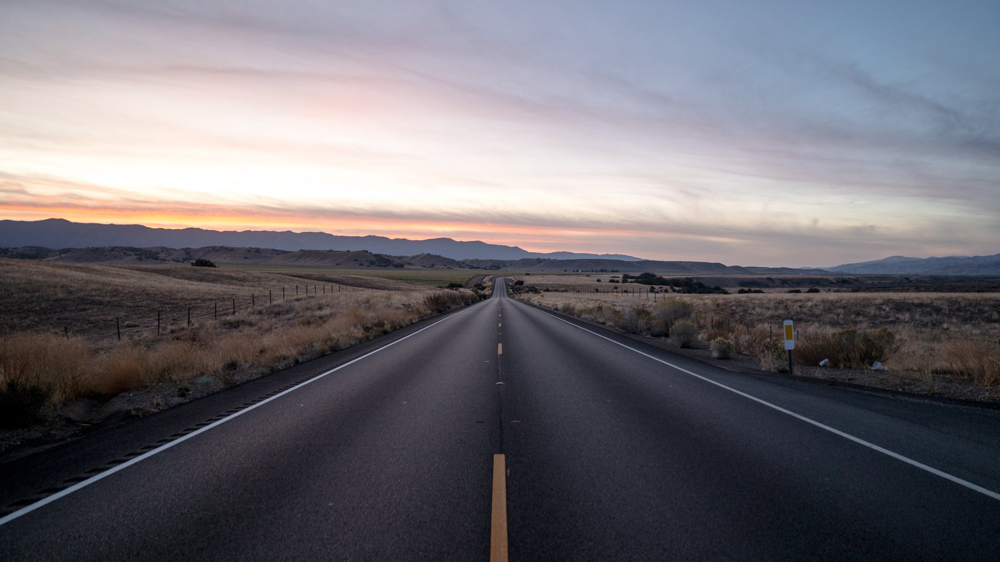

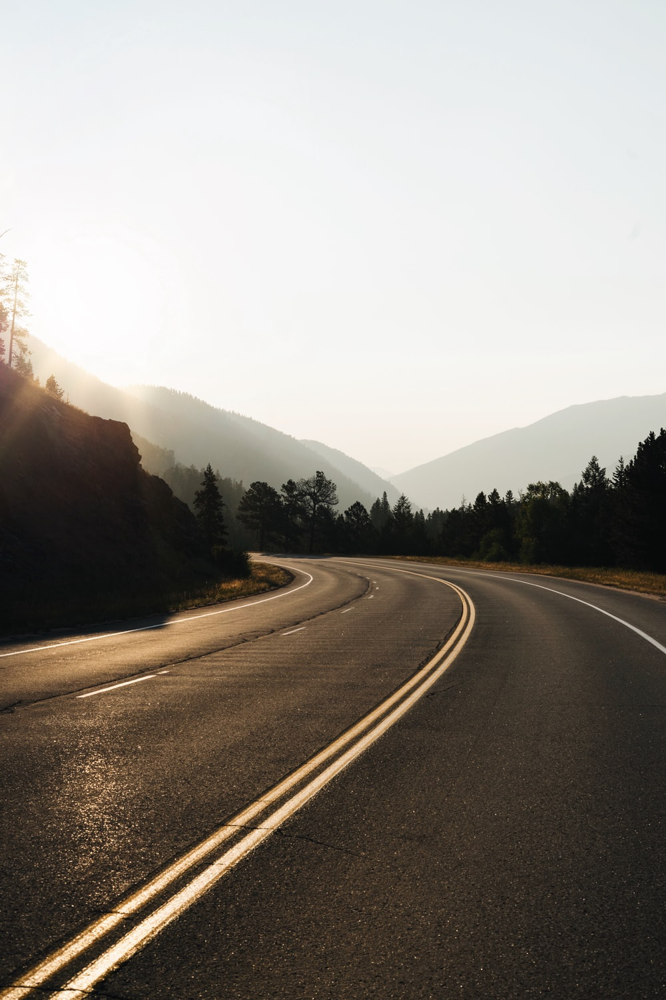

In [168]:
# Load the two images
image1 = Image.open('/content/gdrive/MyDrive/road/Images/clean_8.jpg')
image2 = Image.open('/content/gdrive/MyDrive/road/Images/clean_20.jpg')

# Display the images side by side
image1.show()
image2.show()

In [9]:
df['label'] = df['label'].astype(str)# Conver to a string value because of ImageDataGenerator

In [11]:
from sklearn.model_selection import train_test_split
df_train, df_test = train_test_split(df, test_size = 0.3, random_state=42)
(df_train.shape,df_test.shape)

((165, 3), (72, 3))

In [53]:
print(f'Train images: {df_train.shape}')
print(f'Test images: {df_test.shape}')

Train images: (165, 3)
Test images: (72, 3)


In [12]:
IMG_SHAPE = 256
BATCH_SIZE = 32

traingen=ImageDataGenerator(rescale=1/255.,
                        brightness_range=[0.4,1.4],rotation_range =10 ,
                        width_shift_range=0.2,
                        height_shift_range=0.2,
                        horizontal_flip=True,)


testgen=ImageDataGenerator(rescale=1/255.)

In [13]:
traindata = traingen.flow_from_dataframe(df_train, target_size =(150,150),
                                         x_col='filepath',y_col='label',
                                         batch_size= BATCH_SIZE, class_mode="binary" )

testdata = testgen.flow_from_dataframe(df_test, target_size =(150,150),
                                      shuffle = False,
                                      x_col='filepath',y_col='label',
                                      batch_size= BATCH_SIZE, class_mode="binary" )

Found 165 validated image filenames belonging to 2 classes.
Found 72 validated image filenames belonging to 2 classes.


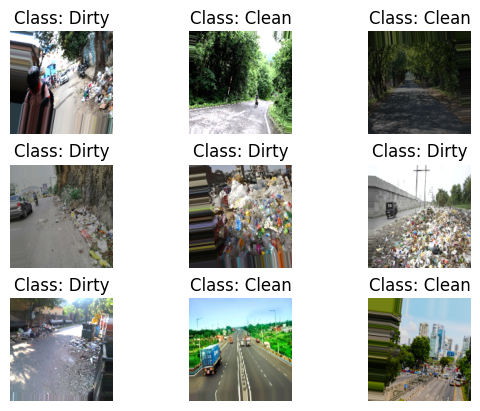

In [15]:
labels=['Clean','Dirty']
samples=traindata.__next__()

images=samples[0]
target=samples[1]

for i in range(9):
    plt.subplot(3,3,i+1)
    plt.subplots_adjust(hspace=0.3,wspace=.3)
    plt.imshow(images[i])
    plt.title(f"Class: {labels[int(target[i])]}")
    plt.axis('off')

# **CNN**

In [28]:
from tensorflow.keras import layers
from tensorflow.keras import Model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import RMSprop

In [20]:
# Our input feature map is 150x150x3: 150x150 for the image pixels, and 3 for
# the three color channels: R, G, and B
img_input = layers.Input(shape=(150, 150, 3))

# First convolution extracts 16 filters that are 3x3
# Convolution is followed by max-pooling layer with a 2x2 window
x = layers.Conv2D(16, 3, activation='relu')(img_input)
x = layers.MaxPooling2D(2)(x)

# Second convolution extracts 32 filters that are 3x3
# Convolution is followed by max-pooling layer with a 2x2 window
x = layers.Conv2D(32, 3, activation='relu')(x)
x = layers.MaxPooling2D(2)(x)

# Third convolution extracts 64 filters that are 3x3
# Convolution is followed by max-pooling layer with a 2x2 window
x = layers.Conv2D(64, 3, activation='relu')(x)
x = layers.MaxPooling2D(2)(x)

# Flatten feature map to a 1-dim tensor so we can add fully connected layers
x = layers.Flatten()(x)

# Create a fully connected layer with ReLU activation and 512 hidden units
x = layers.Dense(512, activation='relu')(x)

# Add a dropout rate of 0.5
x = layers.Dropout(0.5)(x)

# Create output layer with a single node and sigmoid activation
output = layers.Dense(1, activation='sigmoid')(x)

# Create model:
# input = input feature map
# output = input feature map + stacked convolution/maxpooling layers + fully
# connected layer + sigmoid output layer
model = Model(img_input, output)

In [50]:
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 150, 150, 3)]     0         
                                                                 
 conv2d_7 (Conv2D)           (None, 148, 148, 16)      448       
                                                                 
 max_pooling2d_7 (MaxPooling  (None, 74, 74, 16)       0         
 2D)                                                             
                                                                 
 conv2d_8 (Conv2D)           (None, 72, 72, 32)        4640      
                                                                 
 max_pooling2d_8 (MaxPooling  (None, 36, 36, 32)       0         
 2D)                                                             
                                                                 
 conv2d_9 (Conv2D)           (None, 34, 34, 64)        18496 

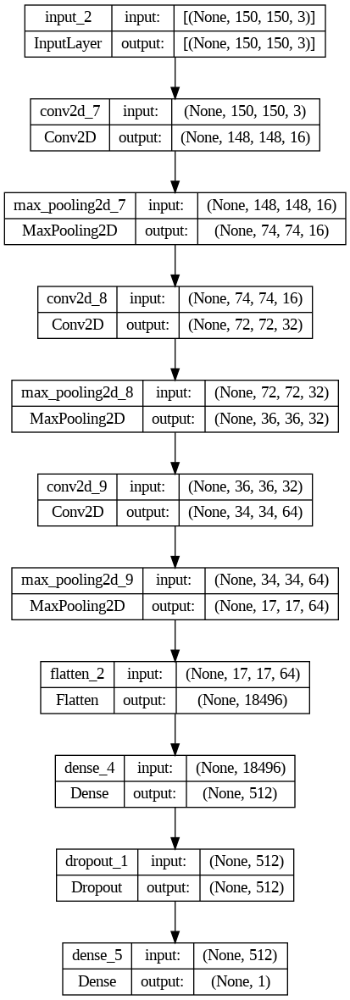

In [51]:
keras.utils.plot_model(model, show_shapes = True)

In [29]:
model.compile(loss='binary_crossentropy',
              optimizer=RMSprop(learning_rate=0.001),
              metrics=['acc'])

In [39]:
history = model.fit(
      traindata,
      epochs=50,
      validation_data=testdata,
      verbose=2,
      shuffle=True)

Epoch 1/50
6/6 - 14s - loss: 0.5247 - acc: 0.7333 - val_loss: 0.4605 - val_acc: 0.7778 - 14s/epoch - 2s/step
Epoch 2/50
6/6 - 16s - loss: 0.5723 - acc: 0.7152 - val_loss: 0.4658 - val_acc: 0.7361 - 16s/epoch - 3s/step
Epoch 3/50
6/6 - 14s - loss: 0.5583 - acc: 0.7394 - val_loss: 0.5038 - val_acc: 0.6944 - 14s/epoch - 2s/step
Epoch 4/50
6/6 - 14s - loss: 0.5447 - acc: 0.7576 - val_loss: 0.4659 - val_acc: 0.8194 - 14s/epoch - 2s/step
Epoch 5/50
6/6 - 13s - loss: 0.5528 - acc: 0.7030 - val_loss: 0.4631 - val_acc: 0.7361 - 13s/epoch - 2s/step
Epoch 6/50
6/6 - 14s - loss: 0.5444 - acc: 0.7091 - val_loss: 0.5033 - val_acc: 0.8056 - 14s/epoch - 2s/step
Epoch 7/50
6/6 - 16s - loss: 0.4450 - acc: 0.7758 - val_loss: 0.5492 - val_acc: 0.7778 - 16s/epoch - 3s/step
Epoch 8/50
6/6 - 14s - loss: 0.5864 - acc: 0.7152 - val_loss: 0.4572 - val_acc: 0.7639 - 14s/epoch - 2s/step
Epoch 9/50
6/6 - 11s - loss: 0.5263 - acc: 0.7394 - val_loss: 0.4045 - val_acc: 0.7917 - 11s/epoch - 2s/step
Epoch 10/50
6/6 - 1

In [40]:
y_test = testdata.classes
y_pred = model.predict(testdata)
y_pred_probs = y_pred.copy()
y_pred[y_pred>0.5] = 1
y_pred[y_pred<0.5] = 0

3/3 [==============================] - 3s 593ms/step


In [106]:
# Evaluate the model on the test data
loss, accuracy = model.evaluate(testdata)

# Print the accuracy
print("Accuracy: {:.2f}%".format(accuracy * 100))

3/3 [==============================] - 4s 811ms/step - loss: 0.3557 - acc: 0.8889
Accuracy: 88.89%


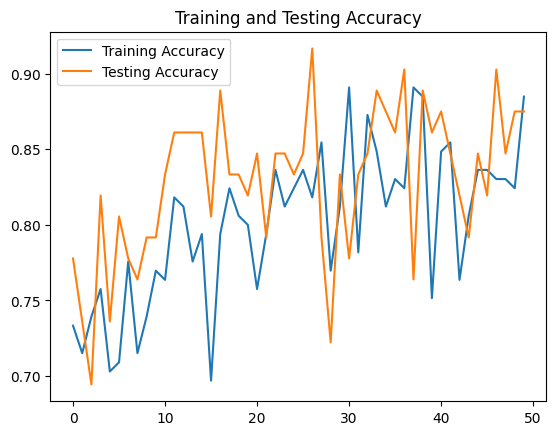

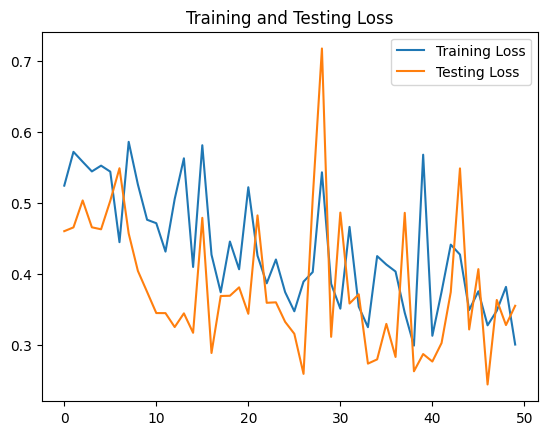

In [49]:
#@title Graphing accuracy and loss
# Retrieve a list of accuracy results on training and testing data
# sets for each training epoch
acc = history.history['acc']
val_acc = history.history['val_acc']

# Retrieve a list of list results on training and testing data
# sets for each training epoch
loss = history.history['loss']
val_loss = history.history['val_loss']

# Get number of epochs
epochs = range(len(acc))

# Plot training and validation accuracy per epoch
plt.plot(epochs, acc, label='Training Accuracy')
plt.plot(epochs, val_acc, label='Testing Accuracy')
plt.title('Training and Testing Accuracy')
plt.legend()

# Plot training and validation loss per epoch
plt.figure()
plt.plot(epochs, loss, label='Training Loss')
plt.plot(epochs, val_loss, label='Testing Loss')
plt.title('Training and Testing Loss')
plt.legend()

In [56]:
test_visual = testgen.flow_from_dataframe(
    dataframe=df_test,
    x_col='filepath',
    y_col='label',
    target_size=(150, 150),
    batch_size=BATCH_SIZE,
    class_mode='binary',
    shuffle=True
)
print(test_visual.class_indices)

Found 72 validated image filenames belonging to 2 classes.
{'0': 0, '1': 1}


In [57]:
test_pred_prob = model.predict(test_visual)

3/3 [==============================] - 4s 1s/step


In [58]:
# must get index array before getting predictions!
test_dir_indices = test_visual.index_array
test_true_labels = [0 if n < 1112 else 1 for n in test_dir_indices] # directory is sorted alphanumerically; 1st 1112: 'O', 2nd 1112: 'R'

# getting predictions in the form of probablities
test_pred_prob = model.predict(test_visual)

# converting the probablities into binary values
test_pred_labels = [1 if n >= 0.5 else 0 for n in test_pred_prob]

print("Model predictions: "+str(test_pred_labels))
print("Actual labels:     "+str(test_true_labels))

# determining the filepaths of misclassified waste
num_misclasssified = 0
misclassified_filepaths = []
correctness = []
for pred_label, true_label, dir_index in zip(test_pred_labels, test_true_labels, test_visual.index_array):
  misclassified_filepaths.append(test_visual.filepaths[dir_index])
  if pred_label != true_label:
    correctness.append('incorrect')
    num_misclasssified += 1
  else:
    correctness.append('correct')

print("# of total images: "+str(len(correctness)))
print("# of misclassified images: "+str(num_misclasssified))

3/3 [==============================] - 2s 624ms/step
Model predictions: [1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0]
Actual labels:     [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
# of total images: 72
# of misclassified images: 43


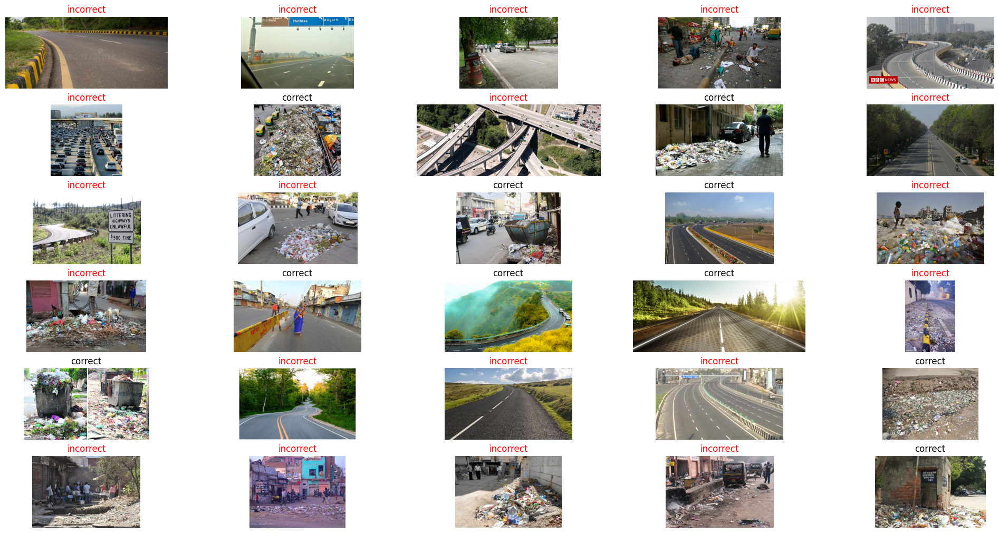

In [61]:
# obtain images from the filepath at the determined indices
misclassified_imgs = []
for filepath in misclassified_filepaths:
  misclassified_imgs.append(mpimg.imread(filepath))

# plot first 30 images
f, axarr = plt.subplots(6,5, figsize=(20,10), constrained_layout=True)  # plt.subplots(row,cols)
count = 0
for r in range(6):
  for c in range(5):
    axarr[r,c].imshow(misclassified_imgs[count])
    if correctness[count] == 'correct':
      axarr[r,c].set_title(correctness[count])
    else:
      axarr[r,c].set_title(correctness[count], color='red')
    axarr[r,c].set_axis_off()
    count += 1
plt.show()

In [43]:
loss, acc = model.evaluate(testdata, verbose=1)
print("Accuracy using evaluate: "+str(acc))
print("Loss using evaluate: "+str(loss))

3/3 [==============================] - 5s 870ms/step - loss: 0.3553 - acc: 0.8750
Accuracy using evaluate: 0.875
Loss using evaluate: 0.35532116889953613


3/3 [==============================] - 5s 558ms/step
AUC: 0.96


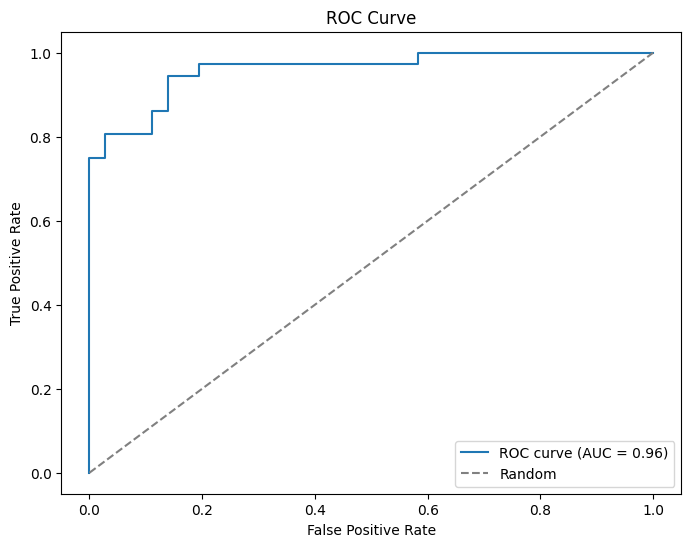

In [179]:
from sklearn.metrics import roc_curve, auc

# Get the predicted probabilities for the positive class
y_pred_probs = model.predict(testdata).ravel()

# Compute the false positive rate (FPR), true positive rate (TPR), and thresholds
fpr, tpr, thresholds = roc_curve(y_test, y_pred_probs)

# Compute the AUC (Area Under the Curve)
auc_score = auc(fpr, tpr)

# Print the AUC score
print("AUC: {:.2f}".format(auc_score))

# Plot the ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label='ROC curve (AUC = {:.2f})'.format(auc_score))
plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Random')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()
plt.show()


In [44]:
print(classification_report(y_test,y_pred,target_names = ['Clean','Dirty']))

              precision    recall  f1-score   support

       Clean       0.97      0.78      0.86        36
       Dirty       0.81      0.97      0.89        36

    accuracy                           0.88        72
   macro avg       0.89      0.88      0.87        72
weighted avg       0.89      0.88      0.87        72



# **SVM**

In [113]:
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense,Flatten
import tensorflow as tf

In [114]:
model1 = keras.models.Sequential([
    keras.layers.Flatten(input_shape = (150, 150, 3)),
    keras.layers.Dense(100, activation = 'relu'),
    keras.layers.Dense(70, activation = 'relu'),
    keras.layers.Dense(50, activation = 'relu'),
    keras.layers.Dense(20, activation = 'relu'),
    keras.layers.Dense(10, activation = 'softmax')
])

In [115]:
model1.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_8 (Flatten)         (None, 67500)             0         
                                                                 
 dense_21 (Dense)            (None, 100)               6750100   
                                                                 
 dense_22 (Dense)            (None, 70)                7070      
                                                                 
 dense_23 (Dense)            (None, 50)                3550      
                                                                 
 dense_24 (Dense)            (None, 20)                1020      
                                                                 
 dense_25 (Dense)            (None, 10)                210       
                                                                 
Total params: 6,761,950
Trainable params: 6,761,950
No

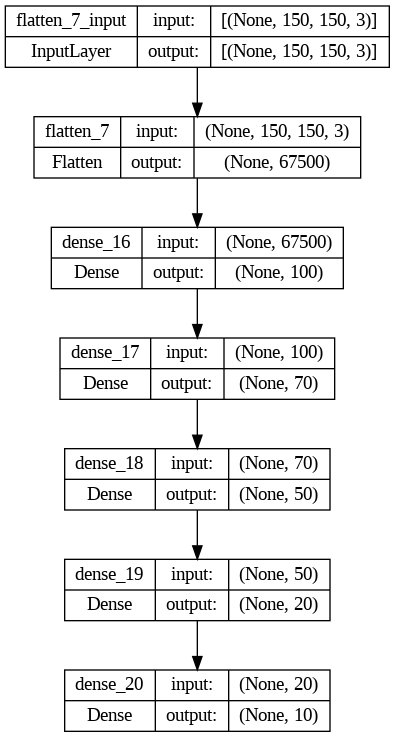

In [110]:
keras.utils.plot_model(model1, show_shapes = True)

In [116]:
model1.compile(loss = tf.keras.losses.SparseCategoricalCrossentropy(),
              optimizer = tf.keras.optimizers.Adam(), metrics = ['accuracy'])

In [118]:
history = model1.fit(x = traindata, validation_data = testdata, epochs=50)

Epoch 1/50
6/6 [==============================] - 11s 2s/step - loss: 3.2744 - accuracy: 0.2424 - val_loss: 0.9405 - val_accuracy: 0.3056
Epoch 2/50
6/6 [==============================] - 10s 2s/step - loss: 1.0614 - accuracy: 0.4242 - val_loss: 1.0847 - val_accuracy: 0.5000
Epoch 3/50
6/6 [==============================] - 11s 2s/step - loss: 1.0630 - accuracy: 0.5273 - val_loss: 1.0562 - val_accuracy: 0.4722
Epoch 4/50
6/6 [==============================] - 10s 2s/step - loss: 1.2860 - accuracy: 0.5455 - val_loss: 1.9754 - val_accuracy: 0.5000
Epoch 5/50
6/6 [==============================] - 11s 2s/step - loss: 0.9540 - accuracy: 0.6061 - val_loss: 1.4144 - val_accuracy: 0.5139
Epoch 6/50
6/6 [==============================] - 10s 2s/step - loss: 0.9967 - accuracy: 0.6485 - val_loss: 1.1262 - val_accuracy: 0.5417
Epoch 7/50
6/6 [==============================] - 12s 2s/step - loss: 0.8504 - accuracy: 0.5939 - val_loss: 1.0837 - val_accuracy: 0.5417
Epoch 8/50
6/6 [==================

In [119]:
y_test = testdata.classes
y_pred = model1.predict(testdata)
y_pred_probs = y_pred.copy()
y_pred[y_pred>0.5] = 1
y_pred[y_pred<0.5] = 0

3/3 [==============================] - 3s 734ms/step


In [120]:
# Evaluate the model on the test data
loss, accuracy = model1.evaluate(testdata)

# Print the accuracy
print("Accuracy: {:.2f}%".format(accuracy * 100))

3/3 [==============================] - 3s 827ms/step - loss: 0.6066 - accuracy: 0.7083
Accuracy: 70.83%


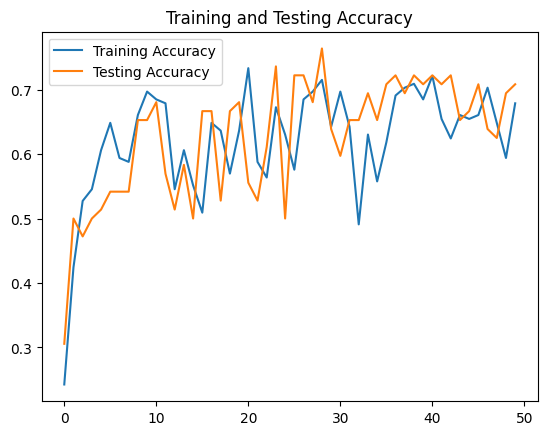

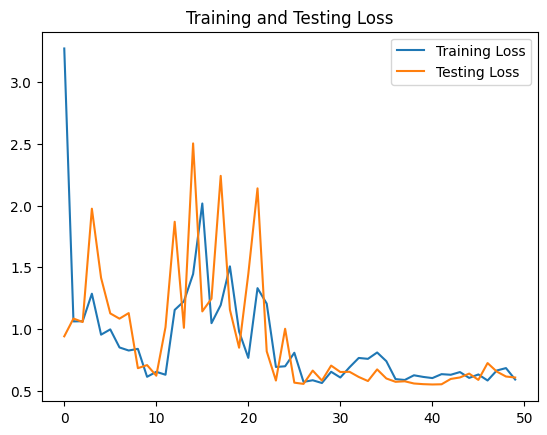

In [141]:
#@title Graphing accuracy and loss
# Retrieve a list of accuracy results on training and testing data
# sets for each training epoch
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

# Retrieve a list of list results on training and testing data
# sets for each training epoch
loss = history.history['loss']
val_loss = history.history['val_loss']

# Get number of epochs
epochs = range(len(acc))

# Plot training and validation accuracy per epoch
plt.plot(epochs, acc, label='Training Accuracy')
plt.plot(epochs, val_acc, label='Testing Accuracy')
plt.title('Training and Testing Accuracy')
plt.legend()

# Plot training and validation loss per epoch
plt.figure()
plt.plot(epochs, loss, label='Training Loss')
plt.plot(epochs, val_loss, label='Testing Loss')
plt.title('Training and Testing Loss')
plt.legend()

In [143]:
test_pred_prob = model1.predict(test_visual)

3/3 [==============================] - 4s 725ms/step


In [144]:
# must get index array before getting predictions!
test_dir_indices = test_visual.index_array
test_true_labels = [0 if n < 1112 else 1 for n in test_dir_indices] # directory is sorted alphanumerically; 1st 1112: 'O', 2nd 1112: 'R'

# getting predictions in the form of probablities
test_pred_prob = model.predict(test_visual)

# converting the probablities into binary values
test_pred_labels = [1 if n >= 0.5 else 0 for n in test_pred_prob]

print("Model predictions: "+str(test_pred_labels))
print("Actual labels:     "+str(test_true_labels))

# determining the filepaths of misclassified waste
num_misclasssified = 0
misclassified_filepaths = []
correctness = []
for pred_label, true_label, dir_index in zip(test_pred_labels, test_true_labels, test_visual.index_array):
  misclassified_filepaths.append(test_visual.filepaths[dir_index])
  if pred_label != true_label:
    correctness.append('incorrect')
    num_misclasssified += 1
  else:
    correctness.append('correct')

print("# of total images: "+str(len(correctness)))
print("# of misclassified images: "+str(num_misclasssified))

3/3 [==============================] - 4s 588ms/step
Model predictions: [1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0]
Actual labels:     [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
# of total images: 72
# of misclassified images: 37


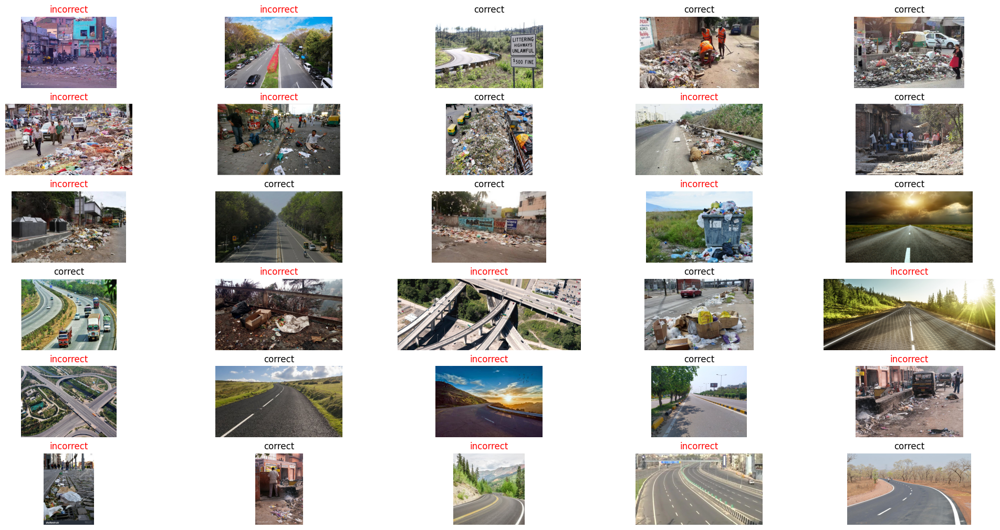

In [145]:
# obtain images from the filepath at the determined indices
misclassified_imgs = []
for filepath in misclassified_filepaths:
  misclassified_imgs.append(mpimg.imread(filepath))

# plot first 30 images
f, axarr = plt.subplots(6,5, figsize=(20,10), constrained_layout=True)  # plt.subplots(row,cols)
count = 0
for r in range(6):
  for c in range(5):
    axarr[r,c].imshow(misclassified_imgs[count])
    if correctness[count] == 'correct':
      axarr[r,c].set_title(correctness[count])
    else:
      axarr[r,c].set_title(correctness[count], color='red')
    axarr[r,c].set_axis_off()
    count += 1
plt.show()

In [146]:
loss, acc = model1.evaluate(testdata, verbose=1)
print("Accuracy using evaluate: "+str(acc))
print("Loss using evaluate: "+str(loss))

3/3 [==============================] - 3s 512ms/step - loss: 0.6066 - accuracy: 0.7083
Accuracy using evaluate: 0.7083333134651184
Loss using evaluate: 0.6065507531166077


3/3 [==============================] - 2s 533ms/step


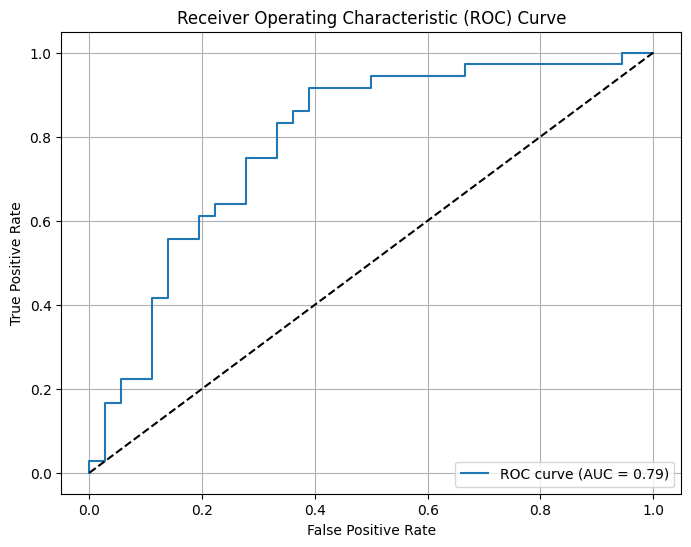

In [177]:
y_pred_probs = model1.predict(testdata)

y_pred_binary = np.argmax(y_pred_probs, axis=1)
y_true_binary = testdata.classes

fpr, tpr, thresholds = roc_curve(y_true_binary, y_pred_probs[:, 1])
auc_score = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label='ROC curve (AUC = {:.2f})'.format(auc_score))
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()


In [178]:
from sklearn.metrics import classification_report
y_pred_probs = model1.predict(testdata)

y_pred_binary = np.argmax(y_pred_probs, axis=1)
y_true_binary = testdata.classes

# Generate the classification report
report = classification_report(y_true_binary, y_pred_binary)

# Print the classification report
print(report)



3/3 [==============================] - 2s 515ms/step
              precision    recall  f1-score   support

           0       0.66      0.86      0.75        36
           1       0.80      0.56      0.66        36

    accuracy                           0.71        72
   macro avg       0.73      0.71      0.70        72
weighted avg       0.73      0.71      0.70        72

